In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Loading dataset h5 using Pandas

df = pd.read_hdf('df_individual_analyzed_merged.h5', key='dataframe')

In [3]:
# printing dataframe

df

val
cond                                  mouse   day   within_factor target            signal_type task_type trial time                      rel_time                 
cond_B6-lodger-10min-habituation      AM22043 day11 wICR          roi_target        Continuous            0     2022-09-28 06:47:00+09:00 0 days 00:00:00  0.000000
                                                                  event_roi_target  Continuous            0     2022-09-28 06:47:00+09:00 0 days 00:00:00  0.000000
                                                                  roi_control       Continuous            0     2022-09-28 06:47:00+09:00 0 days 00:00:00  0.000000
                                                                  event_roi_control Continuous            0     2022-09-28 06:47:00+09:00 0 days 00:00:00  0.000000
                                                                  roi_target        Continuous            0     2022-09-28 06:47:01+09:00 0 days 00:00:01  0.000000
...                                                                                                                                                             ...
cond_single-housing-10min-habituation AM22062 day0  woICR         event_roi_control Continuous            0     2022-11-28 07:53:11+09:00 0 days 00:02:59  0.049988
                                                                  roi_target        Continuous            0     2022-11-28 07:53:12+09:00 0 days 00:03:00  0.000000
                                                                  event_roi_target  Continuous            0     2022-11-28 07:53:12+09:00 0 days 00:03:00  0.000000
                                                                  roi_control       Continuous            0     2022-11-28 07:53:12+09:00 0 days 00:03:00  1.000000
                                                                  event_roi_control Continuous            0     2022-11-28 07:53:12+09:00 0 days 00:03:00  0.000000

[98486 rows x 1 columns]

In [66]:
target_data = data.loc[data.index.get_level_values('target').isin(['roi_target', 'roi_control'])].groupby('target').mean()
event_data = data.loc[data.index.get_level_values('target').isin(['event_roi_target', 'event_roi_control'])].groupby('target').sum()

In [70]:
target_data.reset_index()

,target,val
0,roi_control,0.089539
1,roi_target,0.840820


In [71]:
event_data.reset_index()

,target,val
0,event_roi_control,0.0
1,event_roi_target,0.0


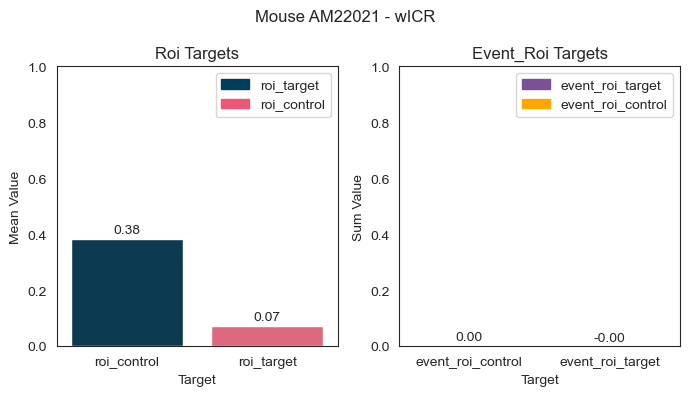

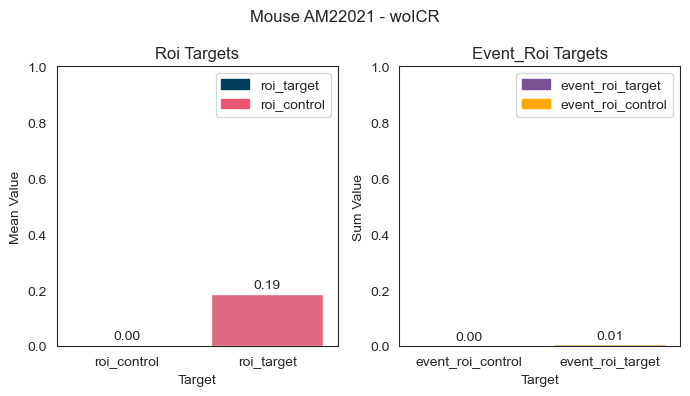

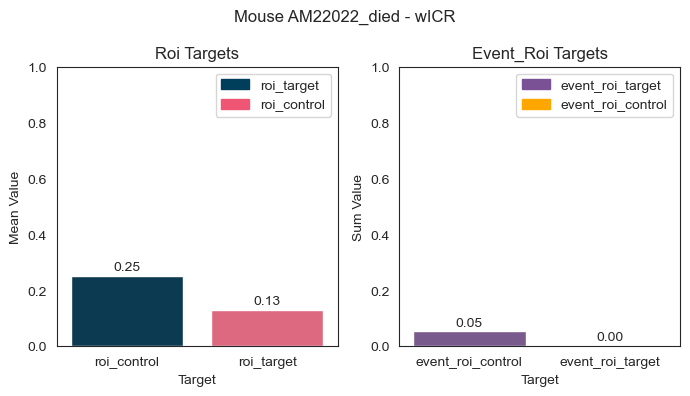

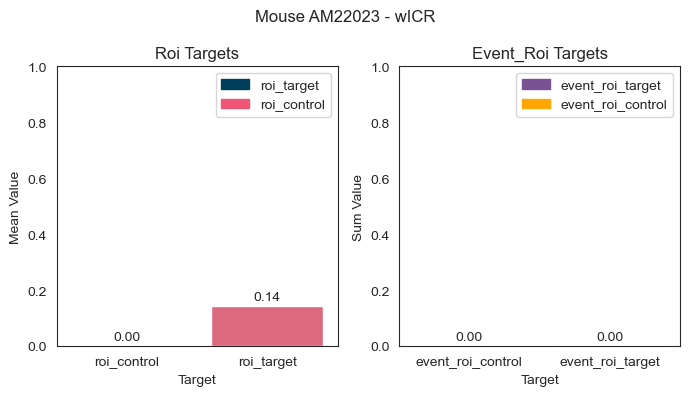

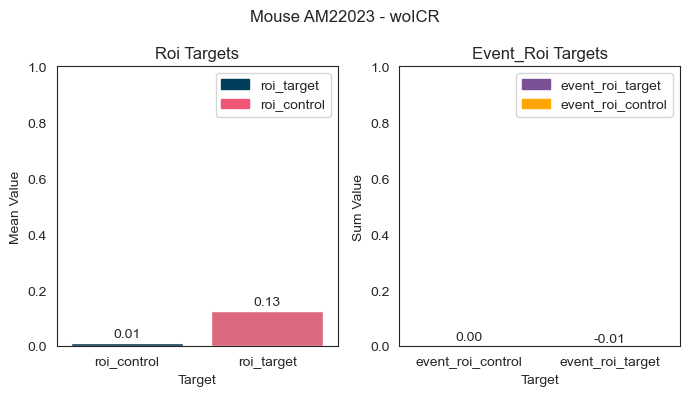

...

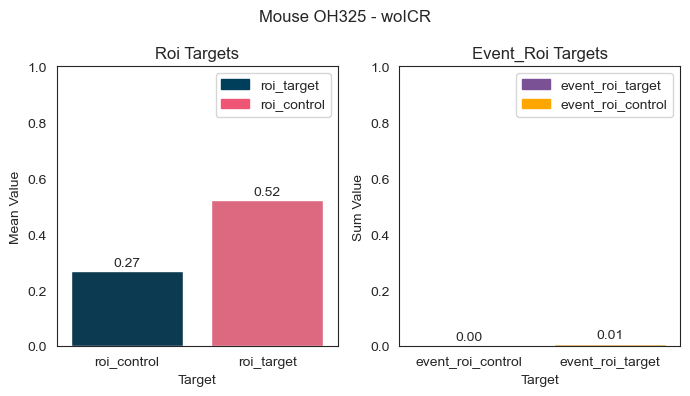

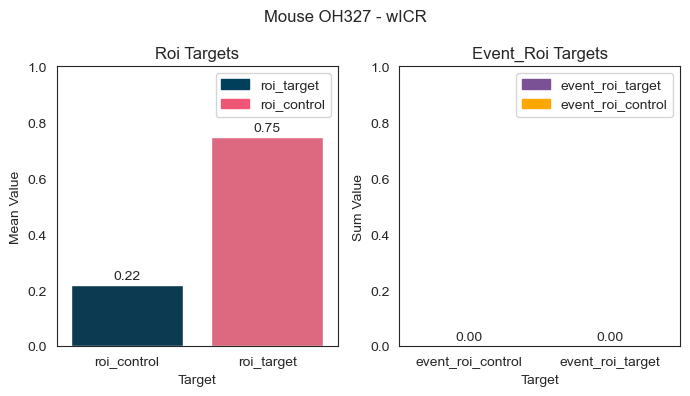

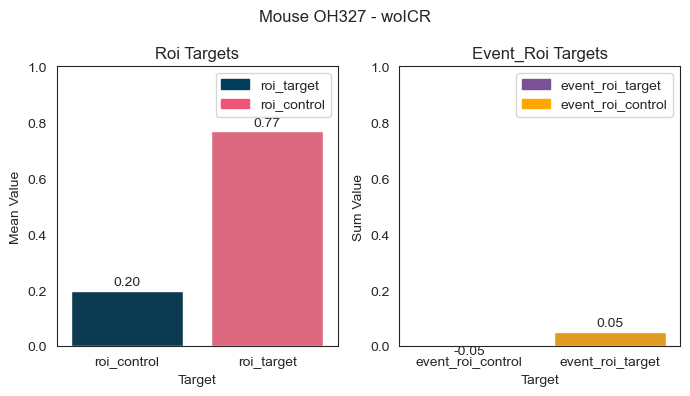

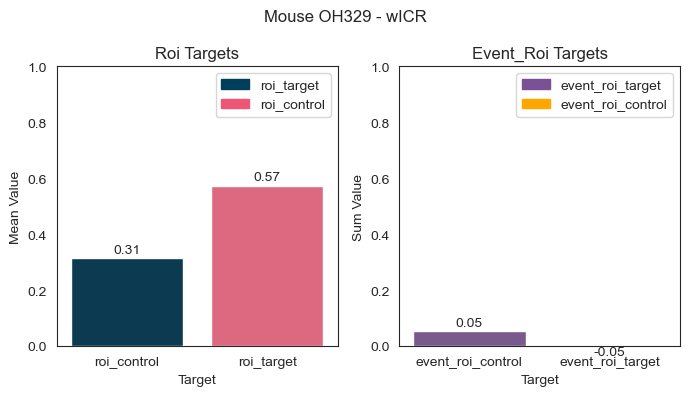

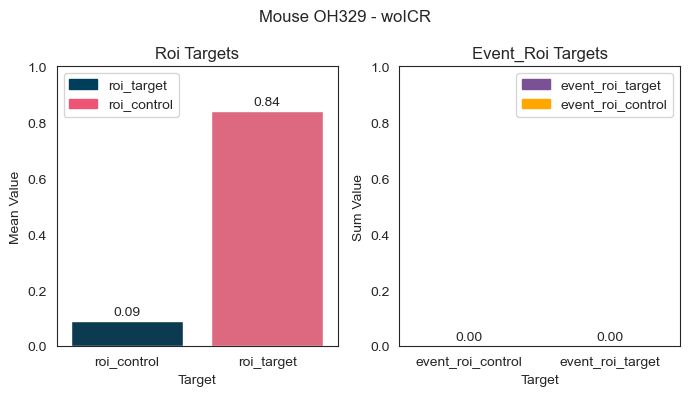

In [108]:
sns.set_style("white")


# Define colors for different target types
colors = {'roi_target': '#003f5c', 'event_roi_target': '#7a5195', 'roi_control': '#ef5675', 'event_roi_control': '#ffa600'}

# Loop over each unique mouse and within_factor combination
for (mouse, within_factor), data in df.groupby(['mouse', 'within_factor']):
    # Create a figure object with 2 subplots
    fig, axs = plt.subplots(ncols=2, figsize=(7, 4))

    # Select the data for each target type
    target_data = data.loc[data.index.get_level_values('target').isin(['roi_target', 'roi_control'])].groupby('target').mean()
    event_data = data.loc[data.index.get_level_values('target').isin(['event_roi_target', 'event_roi_control'])].groupby('target').sum()

    # Create bar plots for each target type in the appropriate subplot
    for i, (plot_data, target_type) in enumerate([(target_data, 'roi'), (event_data, 'event_roi')]):
        if target_type == 'roi':
            ylabel = 'Mean Value'
        else:
            ylabel = 'Sum Value'
        ax = sns.barplot(x=plot_data.index, y=plot_data.values.ravel(), palette=[colors[f'{target_type}_target'], colors[f'{target_type}_control']], ax=axs[i])
        axs[i].set(xlabel='Target', ylabel=ylabel, title=f'{target_type.title()} Targets')
        axs[i].set_ylim([0, 1])
        
        handles = [plt.Rectangle((0,0),1,1, color=color) for color in [colors[f'{target_type}_target'], colors[f'{target_type}_control']]]
        labels = [f'{target_type}_target', f'{target_type}_control']
        axs[i].legend(handles, labels)

        # Add value numbers to the bars
        for patch in ax.patches:
            height = patch.get_height()
            ax.text(patch.get_x()+patch.get_width()/2., height+0.02, f'{height:.2f}', ha="center")

     # Set the title of the figure
    fig.suptitle(f'Mouse {mouse} - {within_factor}')

    # Adjust the layout and spacing of subplots
    fig.tight_layout()

    # Display the plot
    plt.show()

In [34]:
import matplotlib.backends.backend_pdf as pdf

sns.set_style("white")

# Define colors for different target types
colors = {'roi_target': '#003f5c', 'event_roi_target': '#7a5195', 'roi_control': '#ef5675', 'event_roi_control': '#ffa600'}

with pdf.PdfPages('my_plots.pdf') as pdf_pages:
    # Loop over each unique mouse and within_factor combination
    for (mouse, within_factor), data in df.groupby(['mouse', 'within_factor']):
        if mouse == 'AM22022_died':
            continue  # Skip this mouse

        # Create a figure object with 2 subplots
        fig, axs = plt.subplots(ncols=2, figsize=(7, 4))

        # Select the data for each target type
        target_data = data.loc[data.index.get_level_values('target').isin(['roi_target', 'roi_control'])].groupby('target').mean()
        event_data = data.loc[data.index.get_level_values('target').isin(['event_roi_target', 'event_roi_control'])].groupby('target').sum()

        # Create bar plots for each target type in the appropriate subplot
        for i, (plot_data, target_type) in enumerate([(target_data, 'roi'), (event_data, 'event_roi')]):
            if target_type == 'roi':
                ylabel = 'Mean Value'
            else:
                ylabel = 'Sum Value'
            ax = sns.barplot(x=plot_data.index, y=plot_data.values.ravel(), palette=[colors[f'{target_type}_target'], colors[f'{target_type}_control']], ax=axs[i])
            axs[i].set(xlabel='Target', ylabel=ylabel, title=f'{target_type.title()} Targets')
            axs[i].set_ylim([0, 1])

            handles = [plt.Rectangle((0,0),1,1, color=color) for color in [colors[f'{target_type}_target'], colors[f'{target_type}_control']]]
            labels = [f'{target_type}_target', f'{target_type}_control']
            axs[i].legend(handles, labels)

            # Add value numbers to the bars
            for patch in ax.patches:
                height = patch.get_height()
                ax.text(patch.get_x()+patch.get_width()/2., height+0.02, f'{height:.2f}', ha="center")

         # Set the title of the figure
        fig.suptitle(f'Mouse {mouse} - {within_factor}')

        # Adjust the layout and spacing of subplots
        fig.tight_layout()

        # Add the plot to the PDF object
        pdf_pages.savefig(fig)

        # Close the figure object to free memory
        plt.close(fig)


IndexError: index 2 is out of bounds for axis 0 with size 2

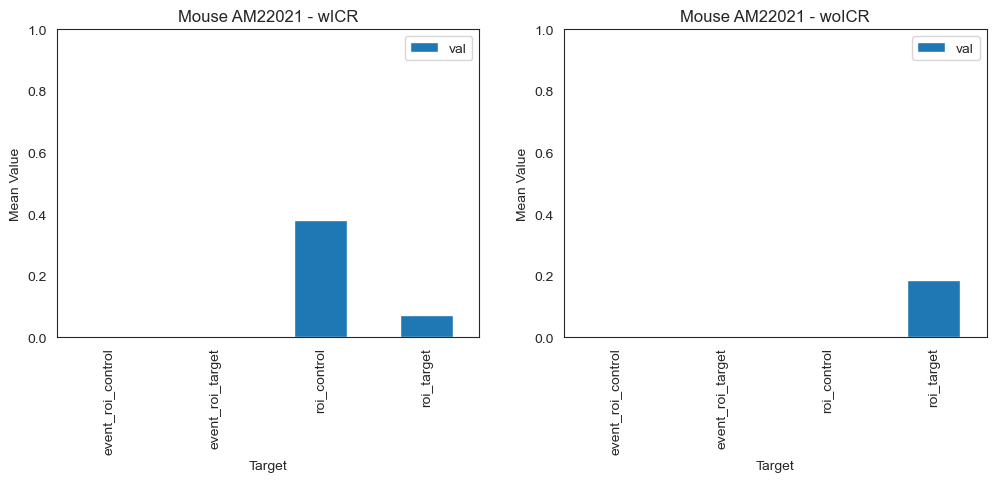

In [41]:
# Create a figure with two subplots
fig, axs = plt.subplots(ncols=2, figsize=(12, 4))

# Group the data by mouse and within_factor
grouped = df.groupby(['mouse', 'within_factor'])

# Loop over each mouse and within_factor value, and create a bar plot for their data
for i, ((mouse, within_factor), data) in enumerate(grouped):
    # Group the data by target, find the mean of their values
    means = data.groupby('target').mean()

    # Create a bar plot for the means in the corresponding subplot
    ax = axs[i]
    means.plot(kind='bar', title=f'Mouse {mouse} - {within_factor}', xlabel='Target', ylabel='Mean Value', ax=ax)
    ax.set_ylim([0, 1])

# Adjust the layout
fig.tight_layout()

# Show the plot
plt.show()

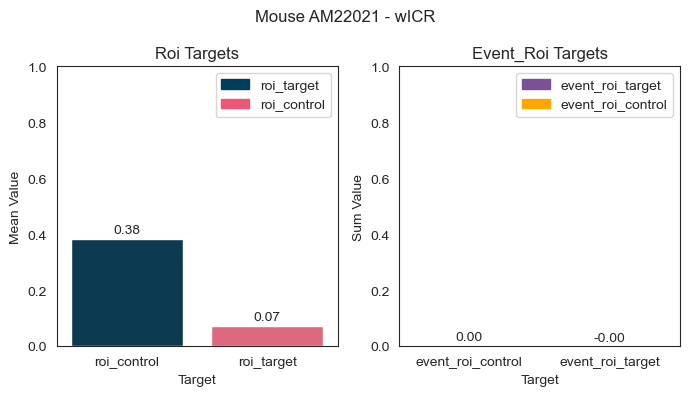

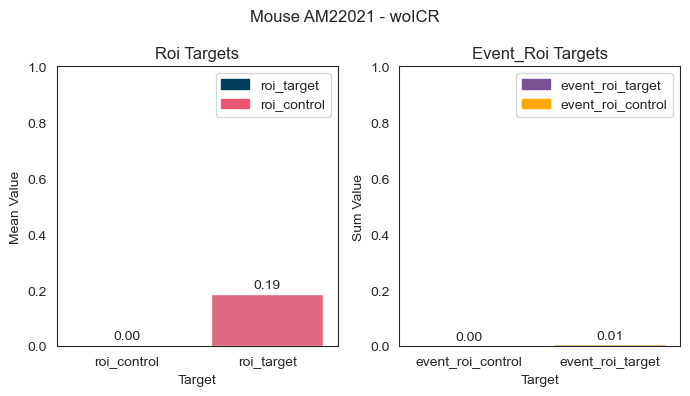

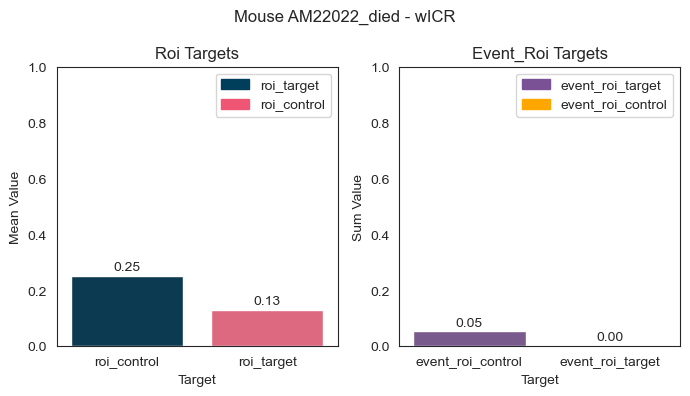

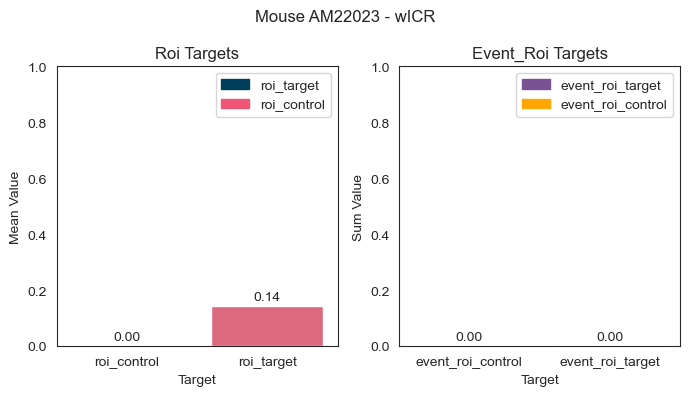

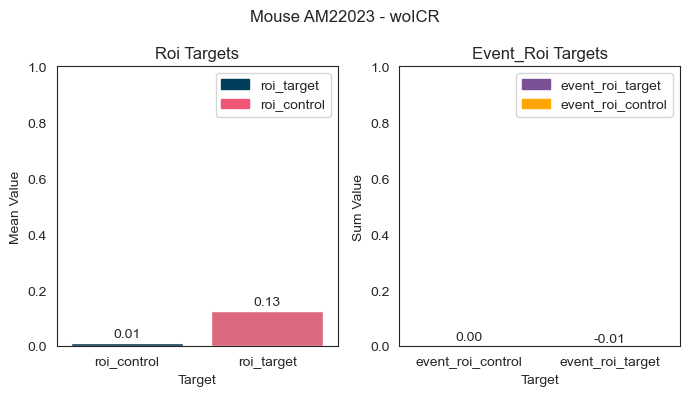

...

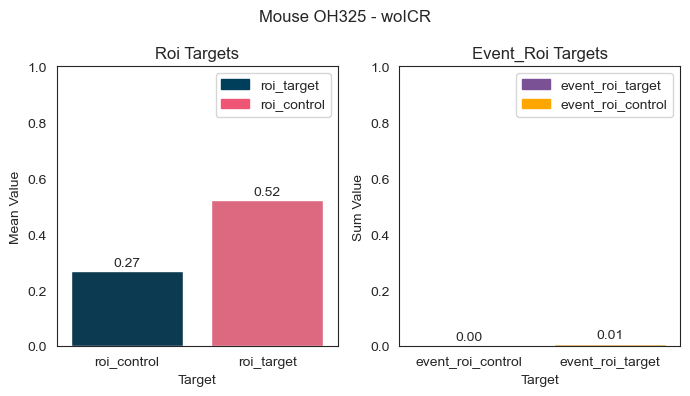

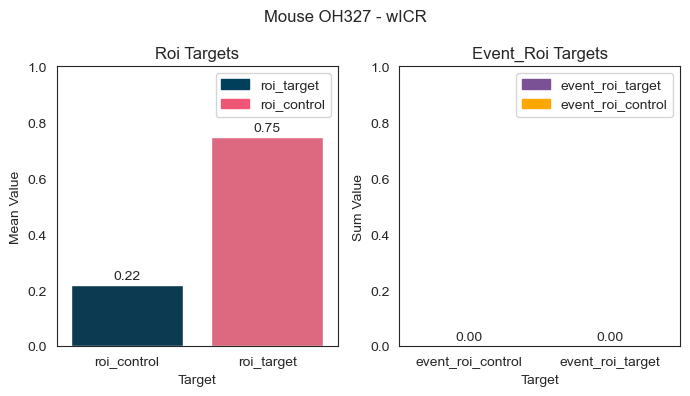

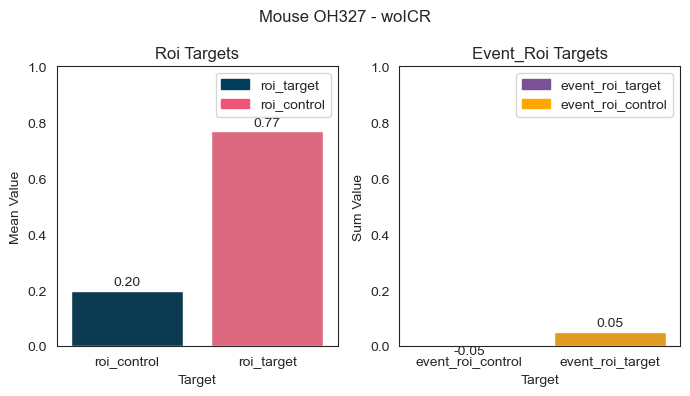

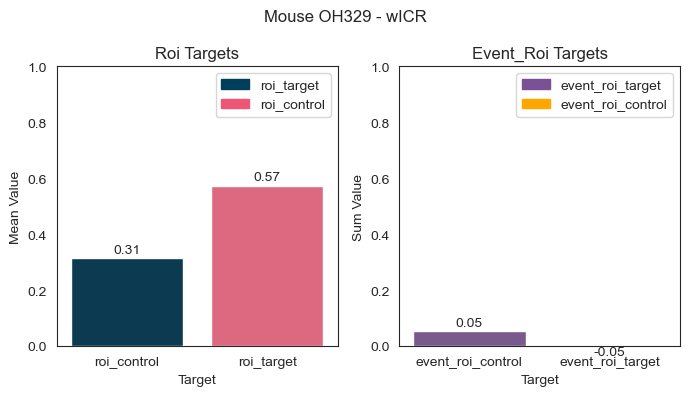

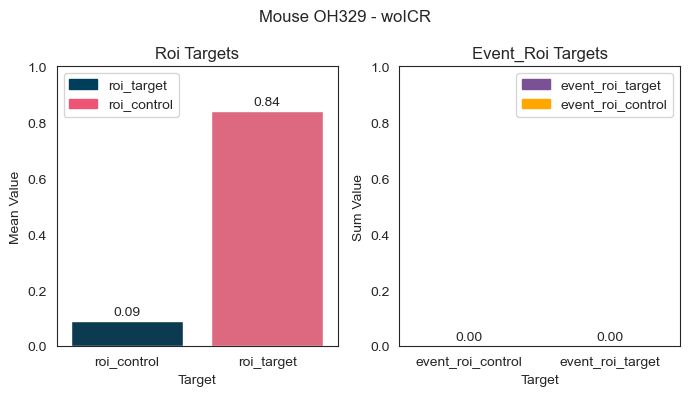

In [80]:
# Define colors for different target types
colors = {'roi_target': '#003f5c', 'event_roi_target': '#7a5195', 'roi_control': '#ef5675', 'event_roi_control': '#ffa600'}

# Loop over each unique mouse and within_factor combination
for (mouse, within_factor), data in df.groupby(['mouse', 'within_factor']):
    # Create a figure object with 2 subplots
    fig, axs = plt.subplots(ncols=2, figsize=(7, 4))

    # Select the data for each target type
    target_data = data.query('target in ["roi_target", "roi_control"]').groupby('target').mean()
    event_data = data.query('target in ["event_roi_target", "event_roi_control"]').groupby('target').sum()

    # Create bar plots for each target type in the appropriate subplot
    for i, (plot_data, target_type) in enumerate([(target_data, 'roi'), (event_data, 'event_roi')]):
        ylabel = 'Mean Value' if target_type == 'roi' else 'Sum Value'
        palette = [colors[f'{target_type}_target'], colors[f'{target_type}_control']]
        sns.barplot(x=plot_data.index, y=plot_data.values.ravel(), palette=palette, ax=axs[i])
        axs[i].set(xlabel='Target', ylabel=ylabel, title=f'{target_type.title()} Targets', ylim=[0, 1])
        axs[i].legend(handles=[plt.Rectangle((0,0),1,1, color=color) for color in palette], labels=[f'{target_type}_target', f'{target_type}_control'])

        # Add value numbers to the bars
        for patch in axs[i].patches:
            height = patch.get_height()
            axs[i].text(patch.get_x()+patch.get_width()/2., height+0.02, f'{height:.2f}', ha="center")

    # Set the title of the figure
    fig.suptitle(f'Mouse {mouse} - {within_factor}')

    # Adjust the layout and spacing of subplots
    fig.tight_layout()

    # Display the plot
    plt.show()

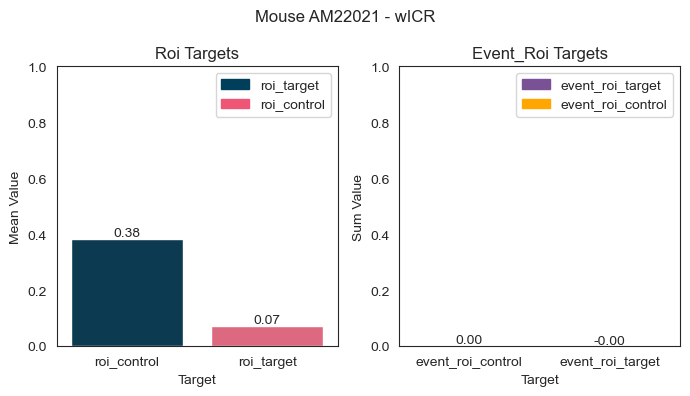

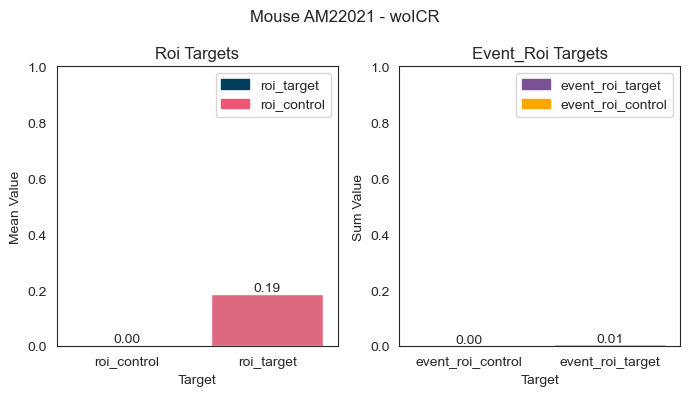

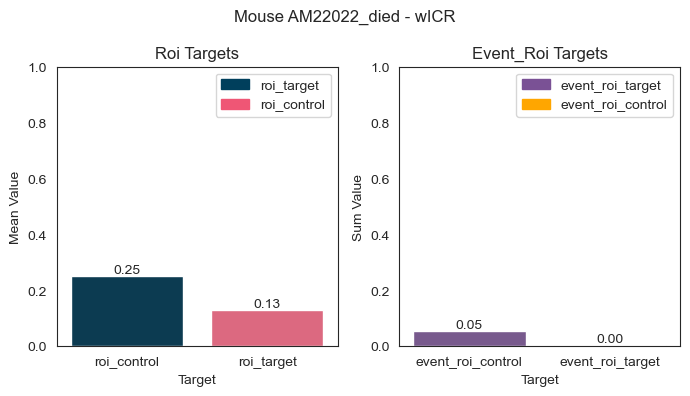

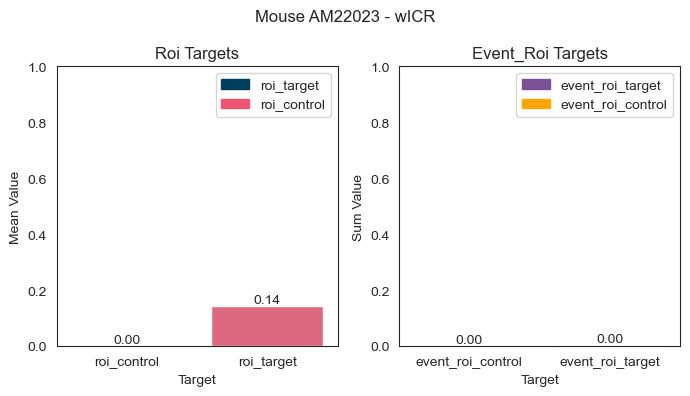

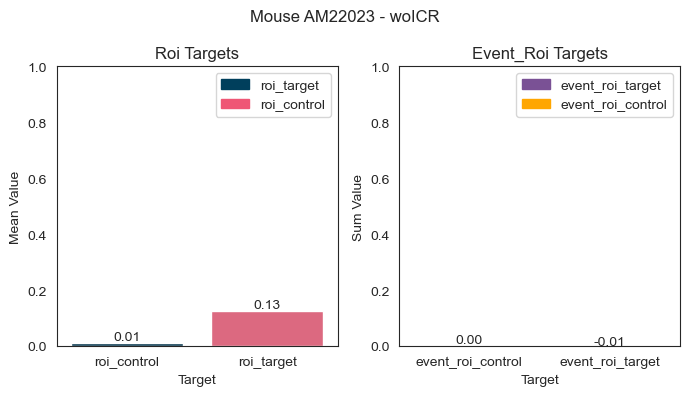

...

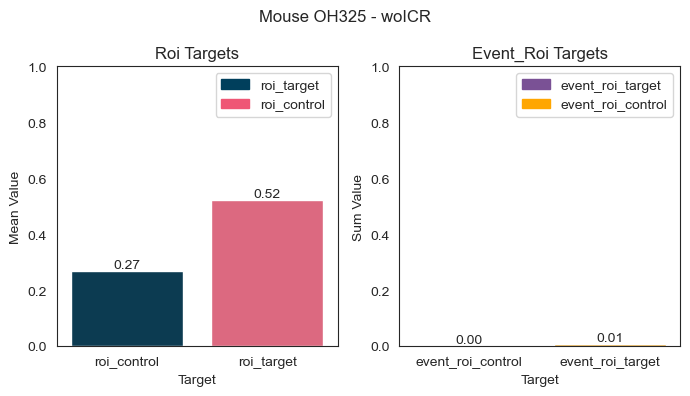

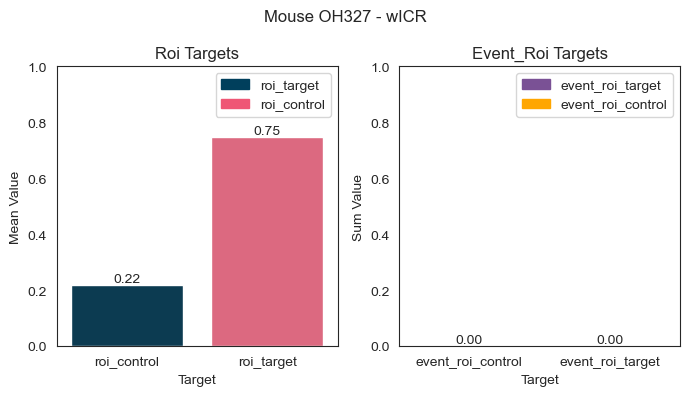

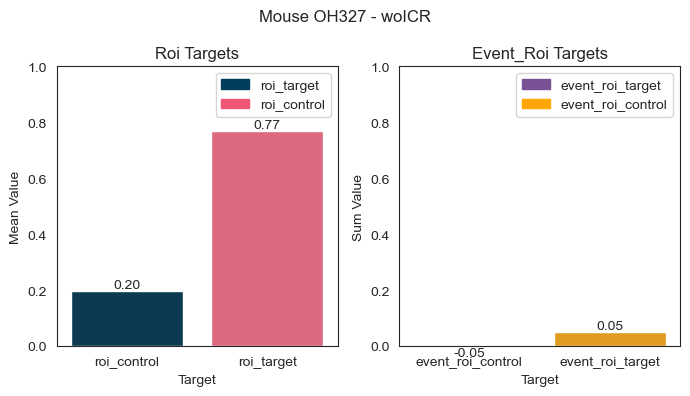

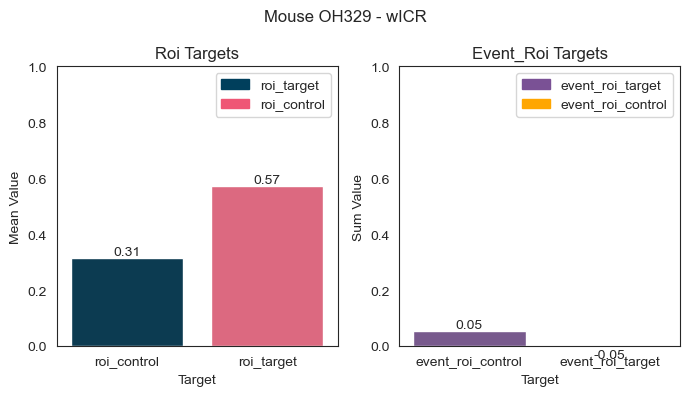

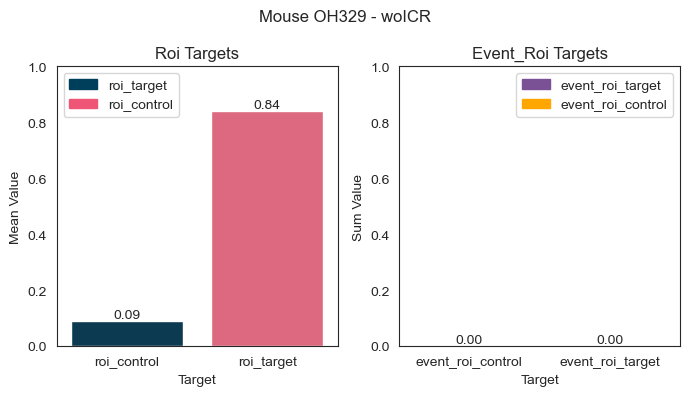

In [117]:
sns.set_style("white")

# Define colors for different target types
colors = {'roi_target': '#003f5c', 'event_roi_target': '#7a5195', 'roi_control': '#ef5675', 'event_roi_control': '#ffa600'}

# Loop over each unique mouse and within_factor combination
for (mouse, within_factor), data in df.groupby(['mouse', 'within_factor']):
    # Create a figure object with 2 subplots
    fig, axs = plt.subplots(ncols=2, figsize=(7, 4))

    # Select the data for each target type
    target_data = data.loc[data.index.get_level_values('target').isin(['roi_target', 'roi_control'])].groupby('target').mean()
    event_data = data.loc[data.index.get_level_values('target').isin(['event_roi_target', 'event_roi_control'])].groupby('target').sum()

    # Create bar plots for each target type in the appropriate subplot
    for i, (plot_data, target_type) in enumerate([(target_data, 'roi'), (event_data, 'event_roi')]):
        if target_type == 'roi':
            ylabel = 'Mean Value'
        else:
            ylabel = 'Sum Value'
        ax = sns.barplot(x=plot_data.index, y=plot_data.values.ravel(), palette=[colors[f'{target_type}_target'], colors[f'{target_type}_control']], ax=axs[i])
        axs[i].set(xlabel='Target', ylabel=ylabel, title=f'{target_type.title()} Targets')
        axs[i].set_ylim([0, 1])
        
        handles = [plt.Rectangle((0,0),1,1, color=color) for color in [colors[f'{target_type}_target'], colors[f'{target_type}_control']]]
        labels = [f'{target_type}_target', f'{target_type}_control']
        axs[i].legend(handles, labels)

        # Add value numbers to the bars
        for patch in ax.patches:
            height = patch.get_height()
            ax.text(patch.get_x()+patch.get_width()/2., height+0.01, f'{height:.2f}', ha="center")

    # Set the title of the figure
    fig.suptitle(f'Mouse {mouse} - {within_factor}')

    # Adjust the layout and spacing of subplots
    fig.tight_layout()

    # Display the plot
    plt.show()


In [ ]:
# 2 bar pltos for each group of mise but all targets must be on the same plot

In [ ]:
# Define colors for different target types
colors = {'roi_target': '#003f5c', 'event_roi_target': '#7a5195', 'roi_control': '#ef5675', 'event_roi_control': '#ffa600'}

for (mouse, within_factor), data in df.groupby(['mouse', 'within_factor']):
    fig, axs = plt.subplots(figsize = (7, 4))
    
    target_data = data.query('target in ["roi_target", "roi_control"]').groupby('target').mean()
    
    for i in target_data:
        sns.barplot
    

In [94]:
data_ni = df.reset_index()

In [95]:
data = pd.DataFrame(data_ni)

In [96]:
data

,cond,mouse,day,within_factor,target,signal_type,task_type,trial,time,rel_time,val
0,cond_B6-lodger-10min-habituation,AM22043,day11,wICR,roi_target,Continuous,,0,2022-09-28 06:47:00+09:00,0 days 00:00:00,0.000000
1,cond_B6-lodger-10min-habituation,AM22043,day11,wICR,event_roi_target,Continuous,,0,2022-09-28 06:47:00+09:00,0 days 00:00:00,0.000000
2,cond_B6-lodger-10min-habituation,AM22043,day11,wICR,roi_control,Continuous,,0,2022-09-28 06:47:00+09:00,0 days 00:00:00,0.000000
3,cond_B6-lodger-10min-habituation,AM22043,day11,wICR,event_roi_control,Continuous,,0,2022-09-28 06:47:00+09:00,0 days 00:00:00,0.000000
4,cond_B6-lodger-10min-habituation,AM22043,day11,wICR,roi_target,Continuous,,0,2022-09-28 06:47:01+09:00,0 days 00:00:01,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
98481,cond_single-housing-10min-habituation,AM22062,day0,woICR,event_roi_control,Continuous,,0,2022-11-28 07:53:11+09:00,0 days 00:02:59,0.049988
98482,cond_single-housing-10min-habituation,AM22062,day0,woICR,roi_target,Continuous,,0,2022-11-28 07:53:12+09:00,0 days 00:03:00,0.000000
98483,cond_single-housing-10min-habituation,AM22062,day0,woICR,event_roi_target,Continuous,,0,2022-11-28 07:53:12+09:00,0 days 00:03:00,0.000000
98484,cond_single-housing-10min-habituation,AM22062,day0,woICR,roi_control,Continuous,,0,2022-11-28 07:53:12+09:00,0 days 00:03:00,1.000000


In [97]:
data.dtypes

cond                                 object
mouse                                object
day                                  object
within_factor                        object
target                               object
signal_type                          object
task_type                            object
trial                                 int64
time             datetime64[ns, Asia/Tokyo]
rel_time                    timedelta64[ns]
val                                 float16
dtype: object

In [98]:
target_data = data.query('target in ["roi_target", "roi_control"]').groupby('target').mean()

In [99]:
target_data

,trial,val
target,,
roi_control,0.0,0.196411
roi_target,0.0,0.501465


In [100]:
data

,cond,mouse,day,within_factor,target,signal_type,task_type,trial,time,rel_time,val
0,cond_B6-lodger-10min-habituation,AM22043,day11,wICR,roi_target,Continuous,,0,2022-09-28 06:47:00+09:00,0 days 00:00:00,0.000000
1,cond_B6-lodger-10min-habituation,AM22043,day11,wICR,event_roi_target,Continuous,,0,2022-09-28 06:47:00+09:00,0 days 00:00:00,0.000000
2,cond_B6-lodger-10min-habituation,AM22043,day11,wICR,roi_control,Continuous,,0,2022-09-28 06:47:00+09:00,0 days 00:00:00,0.000000
3,cond_B6-lodger-10min-habituation,AM22043,day11,wICR,event_roi_control,Continuous,,0,2022-09-28 06:47:00+09:00,0 days 00:00:00,0.000000
4,cond_B6-lodger-10min-habituation,AM22043,day11,wICR,roi_target,Continuous,,0,2022-09-28 06:47:01+09:00,0 days 00:00:01,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
98481,cond_single-housing-10min-habituation,AM22062,day0,woICR,event_roi_control,Continuous,,0,2022-11-28 07:53:11+09:00,0 days 00:02:59,0.049988
98482,cond_single-housing-10min-habituation,AM22062,day0,woICR,roi_target,Continuous,,0,2022-11-28 07:53:12+09:00,0 days 00:03:00,0.000000
98483,cond_single-housing-10min-habituation,AM22062,day0,woICR,event_roi_target,Continuous,,0,2022-11-28 07:53:12+09:00,0 days 00:03:00,0.000000
98484,cond_single-housing-10min-habituation,AM22062,day0,woICR,roi_control,Continuous,,0,2022-11-28 07:53:12+09:00,0 days 00:03:00,1.000000


In [107]:
data['mouse'].unique()

array(['AM22043', 'AM22044', 'AM22045', 'AM22046', 'AM22055', 'AM22056',
       'AM22057', 'AM22058', 'MT290', 'MT291', 'MT292', 'MT293',
       'AM22025', 'AM22027', 'AM22029', 'AM22039', 'AM22040', 'AM22041',
       'AM22042', 'AM22028', 'AM22021', 'AM22022_died', 'AM22026',
       'AM22047', 'AM22048', 'AM22050', 'AM22053', 'AM22049', 'AM22054',
       'AM22030', 'AM22031', 'AM22032', 'AM22034', 'AM22052', 'AM22033',
       'AM22035', 'AM22036', 'AM22037', 'AM22038', 'OH323', 'OH325',
       'OH327', 'OH329', 'AM22023', 'AM22024', 'AM22059', 'AM22060',
       'AM22061', 'AM22062'], dtype=object)

TypeError: Neither the `x` nor `y` variable appears to be numeric.